<a href="https://colab.research.google.com/github/fisicadeparticulas/20211026_analsisdeopendatacms-joseiban/blob/main/W_loneplots_FINAL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd #<--- GRACIAS A isapedraza
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px #<--- GRACIAS A alancovamo

In [ ]:
ESO=pd.read_csv('/content/drive/MyDrive/Masa Bosón W/Sample5.csv')
ESO.head(1000000) #<--- NOS DA EL NÚMERO DE EVENTOS

,Run,Event,pt,eta,phi,Q,chiSq,dxy,iso,MET,phiMET
0,173389,489963747,29.3153,-0.1393,1.3561,1,0.8456,-0.0600,0.0000,30.6670,-2.1308
1,173389,490024840,44.1461,-1.3590,-0.5390,1,1.2943,-0.0126,26.3423,27.9521,-2.6686
2,173389,490102189,42.7895,-1.0193,2.3390,-1,0.8078,-0.0840,2.9748,5.1565,0.3061
3,173389,490092121,31.2215,-0.1270,-0.4889,-1,109.9490,0.0723,56.4897,4.2143,-0.1166
4,173389,490193981,36.9668,1.8557,1.3772,1,1.0597,-0.0676,41.4910,20.9963,-1.6251
...,...,...,...,...,...,...,...,...,...,...,...
99995,171369,55073997,89.2292,1.1032,0.7624,-1,0.5443,-0.0168,0.2016,19.2938,2.3639
99996,171369,55221533,37.6914,-1.3926,-0.6669,-1,0.6061,0.0832,0.5965,7.5065,2.1850
99997,171369,55273989,31.2467,-0.1335,0.3830,-1,0.8857,0.0592,23.6527,23.0953,-3.1020
99998,171369,55354925,42.7469,-0.3049,-0.5734,-1,1.4464,0.0818,24.3723,16.4557,2.1887


In [ ]:
ESN=ESO[abs(ESO.iso)<3] #<--- VALOR DE SIGNIFICANCIA PARA ISO
ESN.head(100000)

,Run,Event,pt,eta,phi,Q,chiSq,dxy,iso,MET,phiMET
0,173389,489963747,29.3153,-0.1393,1.3561,1,0.8456,-0.0600,0.0000,30.6670,-2.1308
2,173389,490102189,42.7895,-1.0193,2.3390,-1,0.8078,-0.0840,2.9748,5.1565,0.3061
5,173389,490263816,38.8076,0.1219,-1.6459,-1,0.7140,0.0676,0.7813,44.7086,0.7723
6,173389,490374429,38.9578,1.5418,-0.7893,-1,1.2098,0.0824,0.6805,47.1312,2.2550
7,173389,490393233,63.9973,1.7514,-1.2813,-1,0.7640,0.0842,1.1697,21.3818,0.6423
...,...,...,...,...,...,...,...,...,...,...,...
99993,171369,55003765,41.6350,1.3808,1.2120,-1,1.1105,-0.0554,0.0000,43.3209,-1.9744
99994,171369,55014949,32.0684,-0.3935,-2.6573,-1,0.7700,-0.0059,0.2172,36.6069,1.0888
99995,171369,55073997,89.2292,1.1032,0.7624,-1,0.5443,-0.0168,0.2016,19.2938,2.3639
99996,171369,55221533,37.6914,-1.3926,-0.6669,-1,0.6061,0.0832,0.5965,7.5065,2.1850


## **Definiciones**

In [ ]:
PTmSO=ESO['pt']
PTvSO=ESO['MET']
PhmSO=ESO['phi']
PhvSO=ESO['phiMET']
ISO=ESO['iso']

PTmSN=ESN['pt']
PTvSN=ESN['MET']
PhmSN=ESN['phi']
PhvSN=ESN['phiMET']
ISN=ESN['iso']

\begin{equation*}
    \text{Ángulo entre el muon y el muon-neutrino del sample} \ \ \ \Delta\phi^{s}=\cos{\phi_{\mu^s}}\cos{\phi_{\nu^s}}+\sin{\phi_{\mu^s}}\sin{\phi_{\nu^s}}
\end{equation*}

In [ ]:
DPHISO=np.arccos(np.cos(ESO['phi'])*np.cos(ESO['phiMET'])+np.sin(ESO['phi'])*np.sin(ESO['phiMET']))
DPHISN=np.arccos(np.cos(ESN['phi'])*np.cos(ESN['phiMET'])+np.sin(ESN['phi'])*np.sin(ESN['phiMET']))

\begin{equation*}
    \text{Masa transversa:} \ \ \ M_T^2=2P_{T1}P_{T2}\left(1-\cos{\Delta\phi}\right)
\end{equation*}

In [ ]:
MTSO=np.sqrt(2*ESO['pt']*ESO['MET']*(1-np.cos(DPHISO)))
MTSN=np.sqrt(2*ESN['pt']*ESN['MET']*(1-np.cos(DPHISN)))

## **MOMENTO TRANSVERSO PARA EL MUON**

In [ ]:
px.histogram(x=PTmSO,y=PTmSO,color_discrete_sequence=['green'],title='Momento transverso del muon original',labels={'x':'Masa (GeV)', 'y':'Eventos'})

(25.0001, 49712.4)

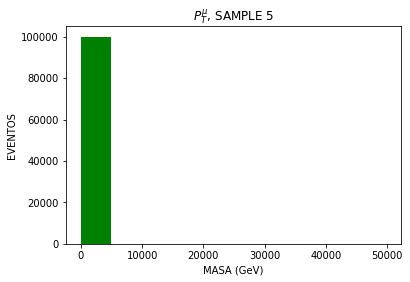

In [ ]:
plt.hist(PTmSO,facecolor='g') #PT MUON ORIGINAL
plt.title('$P_T^\mu$, SAMPLE 5')
plt.xlabel('MASA (GeV)')
plt.ylabel('EVENTOS')
np.nanmin(PTmSO), np.nanmax(PTmSO)

In [ ]:
px.histogram(x=PTmSN,y=PTmSN,title='Momento transverso del muon nuevo',labels={'x':'Masa (GeV)', 'y':'Eventos'})

(25.0005, 14440.2)

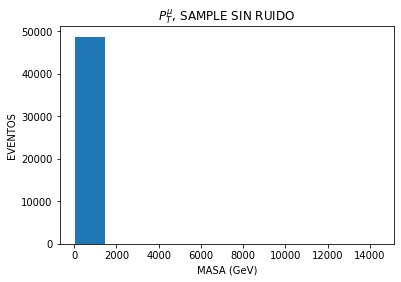

In [ ]:
plt.hist(PTmSN) #PT MUON NUEVO
plt.title('$P_T^\mu$, SAMPLE SIN RUIDO')
plt.xlabel('MASA (GeV)')
plt.ylabel('EVENTOS')
np.nanmin(PTmSN), np.nanmax(PTmSN)

## **MOMENTO TRANSVERSO PARA EL NEUTRINO**

In [ ]:
px.histogram(x=PTvSO,y=PTvSO,color_discrete_sequence=['green'],title='Momento transverso del neutrino original',labels={'x':'Masa (GeV)', 'y':'Eventos'})

(0.0345, 332.55)

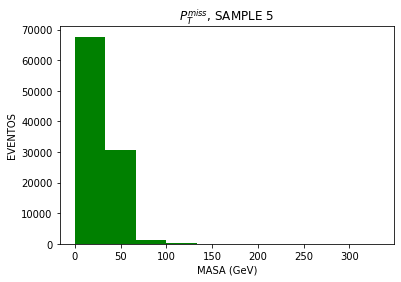

In [ ]:
plt.hist(PTvSO,facecolor='g') #PT NEUTRINO ORIGINAL
plt.title('$P_T^{miss}$, SAMPLE 5')
plt.xlabel('MASA (GeV)')
plt.ylabel('EVENTOS')
np.nanmin(PTvSO), np.nanmax(PTvSO)

In [ ]:
px.histogram(x=PTvSN,y=PTvSN,title='Momento transverso del neutrino nuevo',labels={'x':'Masa (GeV)', 'y':'Eventos'})

(0.3188, 332.55)

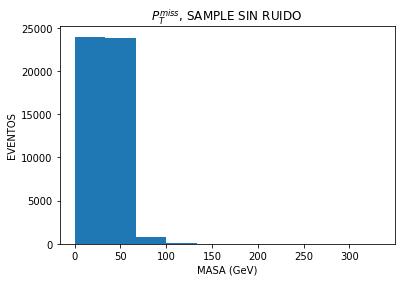

In [ ]:
plt.hist(PTvSN) #PT NEUTRINO NUEVO
plt.title('$P_T^{miss}$, SAMPLE SIN RUIDO')
plt.xlabel('MASA (GeV)')
plt.ylabel('EVENTOS')
np.nanmin(PTvSN), np.nanmax(PTvSN)

## **ÁNGULO $\phi$ DEL MUON**

In [ ]:
px.histogram(x=PhmSO,y=PhmSO,color_discrete_sequence=['green'],title='Ángulo phi del muon original',labels={'x':'Ángulo (rad)', 'y':'Eventos'})

(-3.1413, 3.1416)

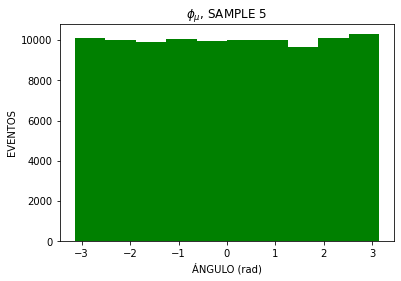

In [ ]:
plt.hist(PhmSO,facecolor='g') #PHI MUON ORIGINAL
plt.title('$\phi_\mu$, SAMPLE 5')
plt.xlabel('ÁNGULO (rad)')
plt.ylabel('EVENTOS')
np.nanmin(PhmSO), np.nanmax(PhmSO)

In [ ]:
px.histogram(x=PhmSN,y=PhmSN,title='Ángulo phi del muon nuevo',labels={'x':'Ángulo (rad)', 'y':'Eventos'})

(-3.1413, 3.1415)

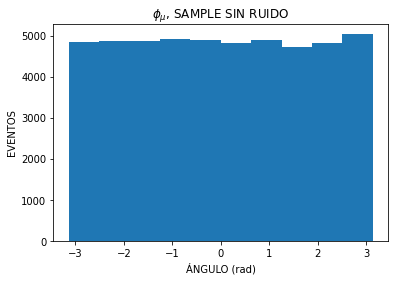

In [ ]:
plt.hist(PhmSN) #PHI MUON NUEVO
plt.title('$\phi_\mu$, SAMPLE SIN RUIDO')
plt.xlabel('ÁNGULO (rad)')
plt.ylabel('EVENTOS')
np.nanmin(PhmSN), np.nanmax(PhmSN)

## **ÁNGULO $\phi$ DEL NEUTRINO**

In [ ]:
px.histogram(x=PhvSO,y=PhvSO,color_discrete_sequence=['green'],title='Ángulo phi del neutrino original',labels={'x':'Ángulo (rad)', 'y':'Eventos'})

(-3.1413, 3.1414)

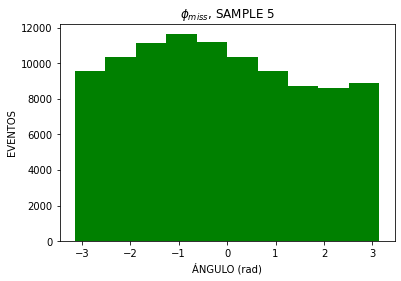

In [ ]:
plt.hist(PhvSO,facecolor='g') #PHI NEUTRINO ORIGINAL
plt.title('$\phi_{miss}}$, SAMPLE 5')
plt.xlabel('ÁNGULO (rad)')
plt.ylabel('EVENTOS')
np.nanmin(PhvSO), np.nanmax(PhvSO)

In [ ]:
px.histogram(x=PhvSN,y=PhvSN,title='Ángulo phi del neutrino nuevo',labels={'x':'Ángulo (rad)', 'y':'Eventos'})

(-3.1412, 3.1411)

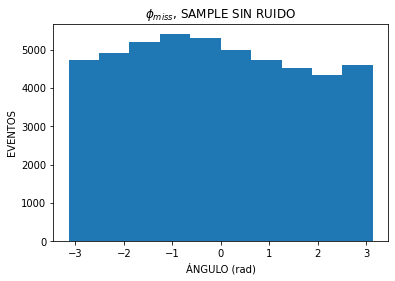

In [ ]:
plt.hist(PhvSN) #PHI NEUTRINO NUEVO
plt.title('$\phi_{miss}}$, SAMPLE SIN RUIDO')
plt.xlabel('ÁNGULO (rad)')
plt.ylabel('EVENTOS')
np.nanmin(PhvSN), np.nanmax(PhvSN)

## **ISO**

In [ ]:
px.histogram(x=ISO,y=ISO,color_discrete_sequence=['green'],title='Aislamiento combinado original',labels={'x':'iso', 'y':'Eventos'})

(0.0, 24918.3)

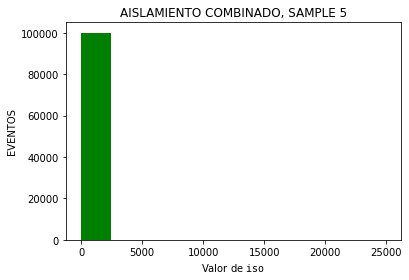

In [ ]:
plt.hist(ISO,facecolor='g') #ISO DEL SAMPLE ORIGINAL
plt.title('AISLAMIENTO COMBINADO, SAMPLE 5')
plt.xlabel('Valor de $\mathtt{iso}$')
plt.ylabel('EVENTOS')
np.nanmin(ISO),np.nanmax(ISO)

In [ ]:
px.histogram(x=ISN,y=ISN,title='Aislamiento combinado nuevo',labels={'x':'iso', 'y':'Eventos'})

(0.0, 2.9998)

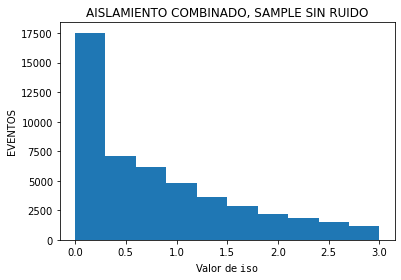

In [ ]:
plt.hist(ISN) #ISO DEL SAMPLE NUEVO
plt.title('AISLAMIENTO COMBINADO, SAMPLE SIN RUIDO')
plt.xlabel('Valor de $\mathtt{iso}$')
plt.ylabel('EVENTOS')
np.nanmin(ISN),np.nanmax(ISN)

## **ÁNGULO $\Delta\phi$:**

In [ ]:
px.histogram(x=DPHISO,y=DPHISO,color_discrete_sequence=['green'],title='Delta phi original',labels={'x':'Ángulo (rad)', 'y':'Eventos'})

(0.00019999999972558624, 3.141585307196424)

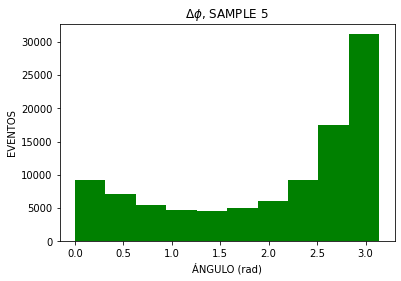

In [ ]:
plt.hist(DPHISO,facecolor='g') #PHI NEUTRINO NUEVO
plt.title('$\Delta\phi$, SAMPLE 5')
plt.xlabel('ÁNGULO (rad)')
plt.ylabel('EVENTOS')
np.nanmin(DPHISO), np.nanmax(DPHISO)

In [ ]:
px.histogram(x=DPHISN,y=DPHISN,title='Delta phi nueva',labels={'x':'Ángulo (rad)', 'y':'Eventos'})

(0.0004000000000633937, 3.141585307196424)

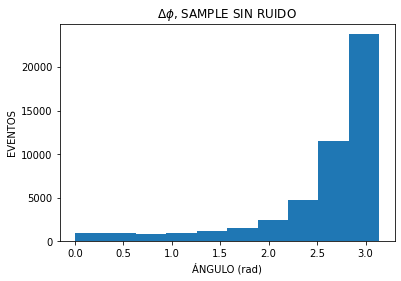

In [ ]:
plt.hist(DPHISN) #PHI NEUTRINO NUEVO
plt.title('$\Delta\phi$, SAMPLE SIN RUIDO')
plt.xlabel('ÁNGULO (rad)')
plt.ylabel('EVENTOS')
np.nanmin(DPHISN), np.nanmax(DPHISN)